In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import STL
import matplotlib as mpl
import matplotlib.pyplot as plt
import calendar

pd.set_option('display.max_columns', None)

In [2]:
def verify(df):
    print(df.shape)
    display(df.head())
    display(df.tail())

# Check Data

## Sales

In [3]:
df_sales = pd.read_csv('data/train_clean.csv')
verify(df_sales)

(3008016, 6)


,index,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-02,1,AUTOMOTIVE,2.0,0
2,2,2013-01-03,1,AUTOMOTIVE,3.0,0
3,3,2013-01-04,1,AUTOMOTIVE,3.0,0
4,4,2013-01-05,1,AUTOMOTIVE,5.0,0


,index,date,store_nbr,family,sales,onpromotion
3008011,3008011,2017-08-11,9,SEAFOOD,23.831000,0
3008012,3008012,2017-08-12,9,SEAFOOD,16.859001,4
3008013,3008013,2017-08-13,9,SEAFOOD,20.000000,0
3008014,3008014,2017-08-14,9,SEAFOOD,17.000000,0
3008015,3008015,2017-08-15,9,SEAFOOD,16.000000,0


In [4]:
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3008016 entries, 0 to 3008015
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   index        int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.7+ MB


In [5]:
df_sales['date'] = pd.to_datetime(df_sales['date'])

In [6]:
print("Stores:")
print(df_sales['store_nbr'].unique(), '\n')

print("Families:")
print(df_sales['family'].unique(), '\n')

Stores:
[ 1 10 11 12 13 14 15 16 17 18 19  2 20 21 22 23 24 25 26 27 28 29  3 30
 31 32 33 34 35 36 37 38 39  4 40 41 42 43 44 45 46 47 48 49  5 50 51 52
 53 54  6  7  8  9] 

Families:
['AUTOMOTIVE' 'BABY CARE' 'BEAUTY' 'BEVERAGES' 'BOOKS' 'BREAD/BAKERY'
 'CELEBRATION' 'CLEANING' 'DAIRY' 'DELI' 'EGGS' 'FROZEN FOODS' 'GROCERY I'
 'GROCERY II' 'HARDWARE' 'HOME AND KITCHEN I' 'HOME AND KITCHEN II'
 'HOME APPLIANCES' 'HOME CARE' 'LADIESWEAR' 'LAWN AND GARDEN' 'LINGERIE'
 'LIQUOR,WINE,BEER' 'MAGAZINES' 'MEATS' 'PERSONAL CARE' 'PET SUPPLIES'
 'PLAYERS AND ELECTRONICS' 'POULTRY' 'PREPARED FOODS' 'PRODUCE'
 'SCHOOL AND OFFICE SUPPLIES' 'SEAFOOD'] 



In [7]:
df_sales.describe()

,index,store_nbr,sales,onpromotion
count,3.008016e+06,3.008016e+06,3.008016e+06,3.008016e+06
mean,1.504008e+06,2.750000e+01,3.582302e+02,2.604221e+00
std,8.683396e+05,1.558579e+01,1.103126e+03,1.222808e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.520038e+05,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.504008e+06,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.256011e+06,4.100000e+01,1.960000e+02,0.000000e+00
max,3.008015e+06,5.400000e+01,1.247170e+05,7.410000e+02


## Oil

In [8]:
df_oil = pd.read_csv('data/oil_clean.csv')
verify(df_oil)

(1704, 2)


,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-05,93.12


,date,dcoilwtico
1699,2017-08-27,47.65
1700,2017-08-28,46.40
1701,2017-08-29,46.46
1702,2017-08-30,45.96
1703,2017-08-31,47.26


In [9]:
df_oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1704 entries, 0 to 1703
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1704 non-null   object 
 1   dcoilwtico  1704 non-null   float64
dtypes: float64(1), object(1)
memory usage: 26.8+ KB


In [10]:
df_oil['date'] = pd.to_datetime(df_oil['date'])

In [11]:
df_oil.describe()

,dcoilwtico
count,1704.000000
mean,67.716626
std,25.627860
min,26.190000
25%,46.407500
50%,53.280000
75%,95.710000
max,110.620000


## Holidays

In [12]:
df_holidays = pd.read_csv('data/holidays_events.csv')
verify(df_holidays)

(350, 6)


,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


,date,type,locale,locale_name,description,transferred
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False
349,2017-12-26,Additional,National,Ecuador,Navidad+1,False


In [13]:
df_holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [14]:
df_holidays['date'] = pd.to_datetime(df_holidays['date'])

In [15]:
print(df_holidays['type'].value_counts(dropna=False))

Holiday       221
Event          56
Additional     51
Transfer       12
Bridge          5
Work Day        5
Name: type, dtype: int64


In [16]:
print(df_holidays['locale'].value_counts(dropna=False))

National    174
Local       152
Regional     24
Name: locale, dtype: int64


In [17]:
print(df_holidays['locale_name'].value_counts(dropna=False))

Ecuador                           174
Quito                              13
Riobamba                           12
Guaranda                           12
Latacunga                          12
Ambato                             12
Guayaquil                          11
Cuenca                              7
Ibarra                              7
Salinas                             6
Loja                                6
Santa Elena                         6
Santo Domingo de los Tsachilas      6
Quevedo                             6
Manta                               6
Esmeraldas                          6
Cotopaxi                            6
El Carmen                           6
Santo Domingo                       6
Machala                             6
Imbabura                            6
Puyo                                6
Libertad                            6
Cayambe                             6
Name: locale_name, dtype: int64


In [18]:
print(df_holidays['description'].value_counts(dropna=False))

Carnaval                              10
Fundacion de Cuenca                    7
Fundacion de Ibarra                    7
Fundacion de Quito                     6
Provincializacion de Santo Domingo     6
                                      ..
Terremoto Manabi+8                     1
Recupero puente Navidad                1
Terremoto Manabi+10                    1
Terremoto Manabi+11                    1
Traslado Fundacion de Quito            1
Name: description, Length: 103, dtype: int64


In [19]:
print(df_holidays['transferred'].value_counts(dropna=False))

False    338
True      12
Name: transferred, dtype: int64


In [20]:
df_holidays.groupby(['locale']).locale_name.value_counts()

locale    locale_name                   
Local     Quito                              13
          Ambato                             12
          Guaranda                           12
          Latacunga                          12
          Riobamba                           12
          Guayaquil                          11
          Cuenca                              7
          Ibarra                              7
          Cayambe                             6
          El Carmen                           6
          Esmeraldas                          6
          Libertad                            6
          Loja                                6
          Machala                             6
          Manta                               6
          Puyo                                6
          Quevedo                             6
          Salinas                             6
          Santo Domingo                       6
National  Ecuador                           174

## Stores

In [21]:
df_stores = pd.read_csv('data/stores.csv')
verify(df_stores)

(54, 5)


,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


,store_nbr,city,state,type,cluster
49,50,Ambato,Tungurahua,A,14
50,51,Guayaquil,Guayas,A,17
51,52,Manta,Manabi,A,11
52,53,Manta,Manabi,D,13
53,54,El Carmen,Manabi,C,3


In [22]:
df_stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [23]:
print(df_stores.state.value_counts(dropna=False))

Pichincha                         19
Guayas                            11
Santo Domingo de los Tsachilas     3
Azuay                              3
Manabi                             3
Cotopaxi                           2
Tungurahua                         2
Los Rios                           2
El Oro                             2
Chimborazo                         1
Imbabura                           1
Bolivar                            1
Pastaza                            1
Santa Elena                        1
Loja                               1
Esmeraldas                         1
Name: state, dtype: int64


In [24]:
print(df_stores.city.value_counts(dropna=False))

Quito            18
Guayaquil         8
Cuenca            3
Santo Domingo     3
Manta             2
Latacunga         2
Machala           2
Ambato            2
Quevedo           1
Esmeraldas        1
Loja              1
Libertad          1
Playas            1
Daule             1
Babahoyo          1
Salinas           1
Puyo              1
Guaranda          1
Ibarra            1
Riobamba          1
Cayambe           1
El Carmen         1
Name: city, dtype: int64


In [25]:
print(df_stores.type.value_counts(dropna=False))

D    18
C    15
A     9
B     8
E     4
Name: type, dtype: int64


In [26]:
print(df_stores.cluster.value_counts(dropna=False))

3     7
6     6
10    6
15    5
13    4
14    4
11    3
4     3
8     3
1     3
9     2
7     2
2     2
12    1
5     1
16    1
17    1
Name: cluster, dtype: int64


In [27]:
print(df_stores.groupby(['state']).city.value_counts(dropna=False))

state                           city         
Azuay                           Cuenca            3
Bolivar                         Guaranda          1
Chimborazo                      Riobamba          1
Cotopaxi                        Latacunga         2
El Oro                          Machala           2
Esmeraldas                      Esmeraldas        1
Guayas                          Guayaquil         8
                                Daule             1
                                Libertad          1
                                Playas            1
Imbabura                        Ibarra            1
Loja                            Loja              1
Los Rios                        Babahoyo          1
                                Quevedo           1
Manabi                          Manta             2
                                El Carmen         1
Pastaza                         Puyo              1
Pichincha                       Quito            18
                  

In [28]:
print(df_stores.groupby('cluster').state.value_counts(dropna=False))

cluster  state                         
1        Guayas                            2
         Santa Elena                       1
2        Azuay                             2
3        Guayas                            3
         El Oro                            1
         Los Rios                          1
         Manabi                            1
         Santo Domingo de los Tsachilas    1
4        El Oro                            1
         Loja                              1
         Santo Domingo de los Tsachilas    1
5        Pichincha                         1
6        Pichincha                         3
         Azuay                             1
         Guayas                            1
         Santo Domingo de los Tsachilas    1
7        Chimborazo                        1
         Pastaza                           1
8        Pichincha                         3
9        Pichincha                         1
         Tungurahua                        1
10       Guayas

In [29]:
print(df_stores.groupby('cluster').type.value_counts(dropna=False))

cluster  type
1        D       3
2        D       2
3        C       7
4        D       3
5        A       1
6        B       6
7        C       2
8        D       3
9        D       2
10       E       4
         B       1
         D       1
11       A       3
12       C       1
13       D       4
14       A       4
15       C       5
16       B       1
17       A       1
Name: type, dtype: int64


## Transactions

In [30]:
df_transactions = pd.read_csv('data/transactions_clean.csv')
verify(df_transactions)

(91152, 3)


,date,store_nbr,transactions
0,2013-01-01,25.0,770.0
1,2013-01-02,25.0,1038.0
2,2013-01-03,25.0,887.0
3,2013-01-04,25.0,1054.0
4,2013-01-05,25.0,1355.0


,date,store_nbr,transactions
91147,2017-08-11,52.0,2957.0
91148,2017-08-12,52.0,2804.0
91149,2017-08-13,52.0,2433.0
91150,2017-08-14,52.0,2074.0
91151,2017-08-15,52.0,2255.0


In [31]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91152 entries, 0 to 91151
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          91152 non-null  object 
 1   store_nbr     91152 non-null  float64
 2   transactions  91152 non-null  float64
dtypes: float64(2), object(1)
memory usage: 2.1+ MB


In [32]:
df_transactions['date'] = pd.to_datetime(df_transactions['date'])

In [33]:
df_transactions.describe()

,store_nbr,transactions
count,91152.00000,91152.000000
mean,27.50000,1552.121127
std,15.58587,1034.916203
min,1.00000,0.000000
25%,14.00000,926.000000
50%,27.50000,1329.000000
75%,41.00000,1974.000000
max,54.00000,8359.000000


# EDA

## Sales

In [35]:
df_sales['year'] = pd.to_datetime(df_sales['date']).dt.year
df_sales['month'] = pd.to_datetime(df_sales['date']).dt.month
df_sales['day'] = pd.to_datetime(df_sales['date']).dt.day
df_sales['day_of_week'] = pd.to_datetime(df_sales['date']).dt.dayofweek
df_sales

,index,date,store_nbr,family,sales,onpromotion,year,month,day,day_of_week
0,0,2013-01-01,1,AUTOMOTIVE,0.000000,0,2013,1,1,1
1,1,2013-01-02,1,AUTOMOTIVE,2.000000,0,2013,1,2,2
2,2,2013-01-03,1,AUTOMOTIVE,3.000000,0,2013,1,3,3
3,3,2013-01-04,1,AUTOMOTIVE,3.000000,0,2013,1,4,4
4,4,2013-01-05,1,AUTOMOTIVE,5.000000,0,2013,1,5,5
...,...,...,...,...,...,...,...,...,...,...
3008011,3008011,2017-08-11,9,SEAFOOD,23.831000,0,2017,8,11,4
3008012,3008012,2017-08-12,9,SEAFOOD,16.859001,4,2017,8,12,5
3008013,3008013,2017-08-13,9,SEAFOOD,20.000000,0,2017,8,13,6
3008014,3008014,2017-08-14,9,SEAFOOD,17.000000,0,2017,8,14,0


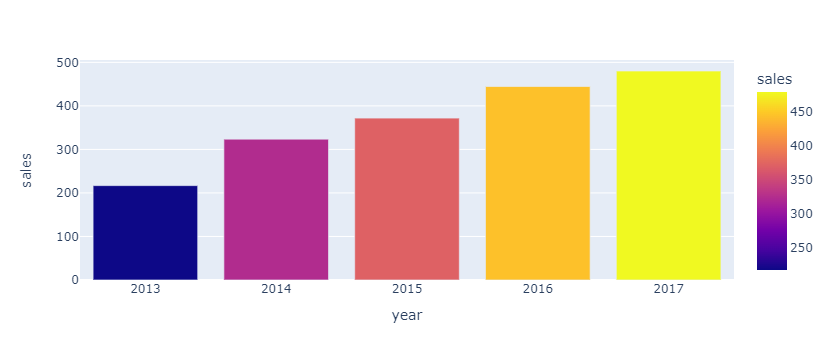

In [36]:
by_year_df = df_sales.groupby(['year'])['sales'].mean().reset_index()
fig = px.bar(by_year_df, x='year', y='sales', color='sales')
fig.show()

Tendência positiva nas vendas ao longo dos anos.

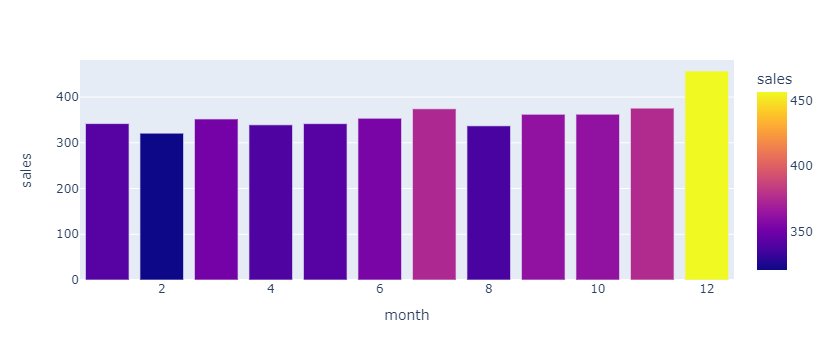

In [37]:
by_month_df = df_sales.groupby(['month'])['sales'].mean().reset_index()
fig = px.bar(by_month_df, x='month', y='sales', color='sales')
fig.show()

Mais vendas no mês de dezembro, provavelmente afetado pelas festas de final de ano.

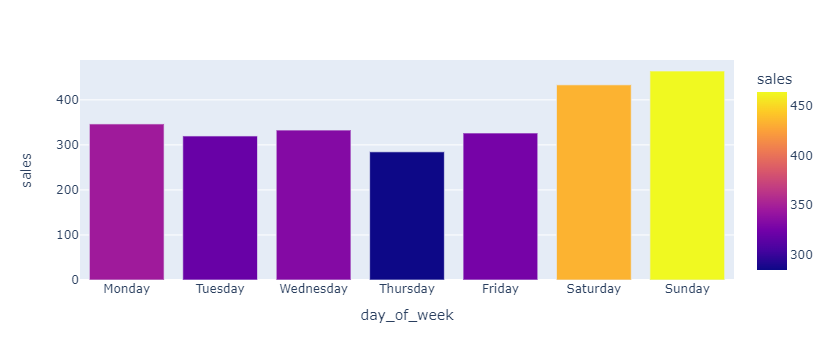

In [38]:
by_weekday_df = df_sales.groupby(['day_of_week'])['sales'].mean().to_frame().reset_index()
by_weekday_df['day_of_week'] = calendar.day_name[0:]
fig = px.bar(by_weekday_df, x='day_of_week', y='sales', color='sales')
fig.show()

Mais pessoas costumam ir ao supermercado nos finais de semana.

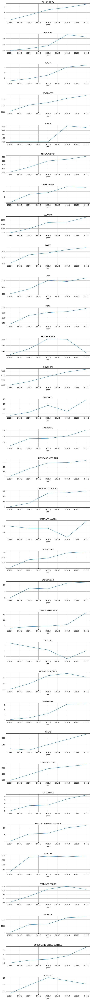

In [41]:
fig= plt.figure(figsize=(10,120))
fig.subplots_adjust(hspace=0.75)
for i,product in enumerate(df_sales.family.unique()):
    ax = fig.add_subplot(33,1,i+1)
    df_sales.query('family==@product').groupby(['year']).sales.mean().plot()
    ax.grid(True)
    plt.title(product)

Quase todas as famílias de produtos cresceram de forma estável até 2017.

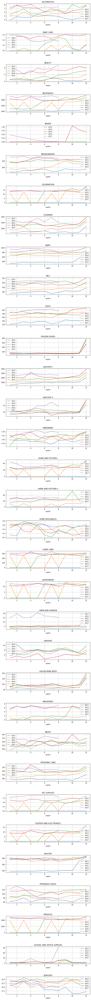

In [42]:
fig= plt.figure(figsize=(10,120))
fig.subplots_adjust(hspace=0.75)
for i,product in enumerate(df_sales.family.unique()):
    ax = fig.add_subplot(33,1,i+1)
    select = df_sales.query('family==@product')
    for year in [2013,2014,2015,2016,2017]: 
        select.query('year==@year').groupby('month').sales.mean().plot(ax=ax,label=year)
    plt.title(product)
    ax.legend()
    ax.grid(True)

É difícil ver alguns efeitos sazonais nos gráficos, exceto para alguns itens no final de ano. Os alimentos congelados (Frozen Foods) são afetados no mês de dezembro.

Text(0.5, 1.0, 'Sales Average by Day of Month')

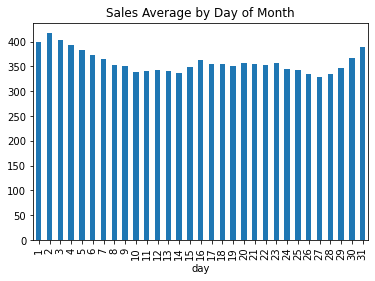

In [43]:
df_sales.groupby('day').sales.mean().plot(kind='bar')
plt.title('Sales Average by Day of Month')

- "Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this."
- É possível ver dois picos ao redor dos dias de pagamento (começo/fim do mês e dia 15).

Text(0.5, 1.0, 'Sales Ranking by Store')

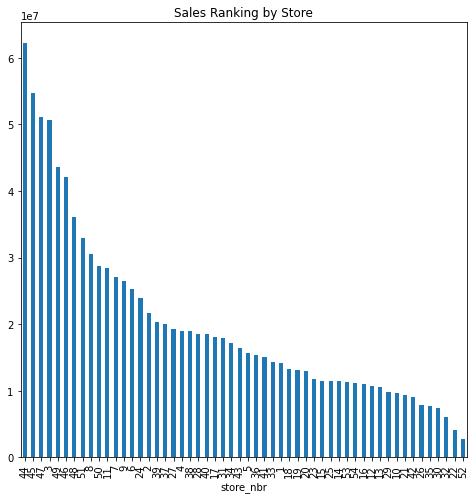

In [44]:
plt.figure(figsize=(8,8))
df_sales.groupby('store_nbr').sales.sum().sort_values(ascending=False).plot(kind='bar')
plt.title('Sales Ranking by Store')

Text(0.5, 1.0, 'Promotion Items Ranking by Store')

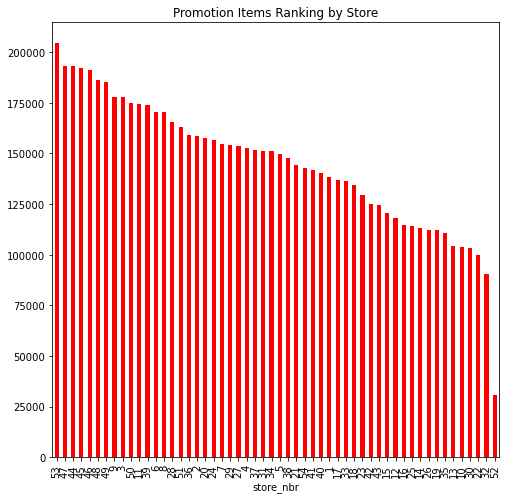

In [45]:
plt.figure(figsize=(8,8))
df_sales.groupby('store_nbr').onpromotion.sum().sort_values(ascending=False).plot(kind='bar',color='red')
plt.title('Promotion Items Ranking by Store')

Text(0.5, 1.0, 'Promotion and Sales Relationship')

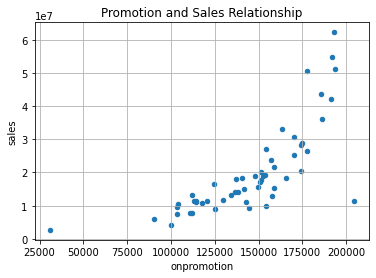

In [46]:
df_sales.groupby('store_nbr')[['onpromotion','sales']].sum().plot.scatter('onpromotion','sales')
plt.grid(True)
plt.title('Promotion and Sales Relationship')

Quantidade de itens e vendas têm correlação positiva, como mostra o gráfico. A loja número 53 tem muitas promoções, mas não tem muitas vendas.

In [47]:
df_total_sales = df_sales.groupby("date")[["sales"]].sum().reset_index()
df_total_sales["datetime"] = pd.to_datetime(df_total_sales["date"])
df_total_sales.set_index("datetime", inplace=True)
verify(df_total_sales)

(1688, 2)


,date,sales
datetime,,
2013-01-01,2013-01-01,2511.618999
2013-01-02,2013-01-02,496092.417944
2013-01-03,2013-01-03,361461.231124
2013-01-04,2013-01-04,354459.677093
2013-01-05,2013-01-05,477350.121229


,date,sales
datetime,,
2017-08-11,2017-08-11,826373.722022
2017-08-12,2017-08-12,792630.535079
2017-08-13,2017-08-13,865639.677471
2017-08-14,2017-08-14,760922.406081
2017-08-15,2017-08-15,762661.935939


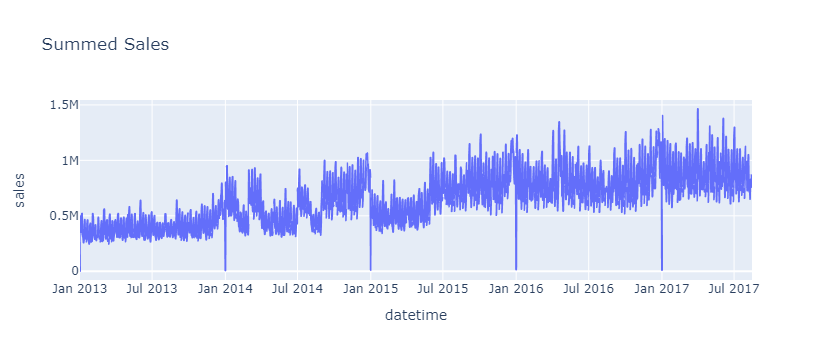

In [48]:
fig = px.line(df_total_sales, 
              x=df_total_sales.index, 
              y="sales",  
              title='Summed Sales')
fig.show()

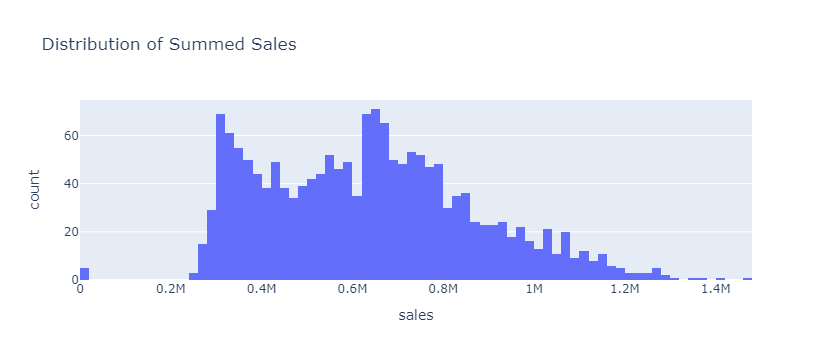

In [49]:
fig = px.histogram(df_total_sales, 
                   x="sales",  
                   title='Distribution of Summed Sales',
                   nbins=100)
fig.show()

### ACF

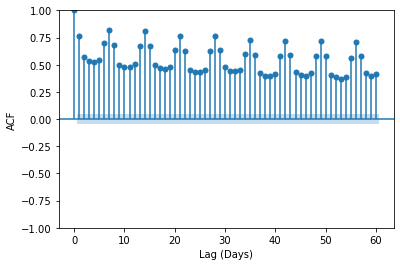

In [50]:
fig = plot_acf(df_total_sales["sales"], lags=60, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (Days)")
plt.show()

Foi observado um ciclo de 7 dias.

C:\Users\gduar\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



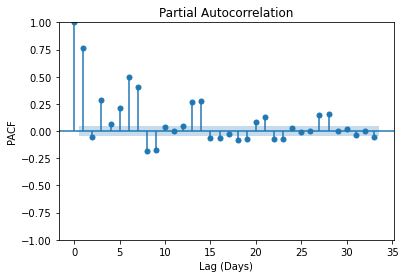

In [51]:
fig = plot_pacf(df_total_sales["sales"])
plt.ylabel("PACF")
plt.xlabel("Lag (Days)")
plt.show()

### Seasonal Decomposition

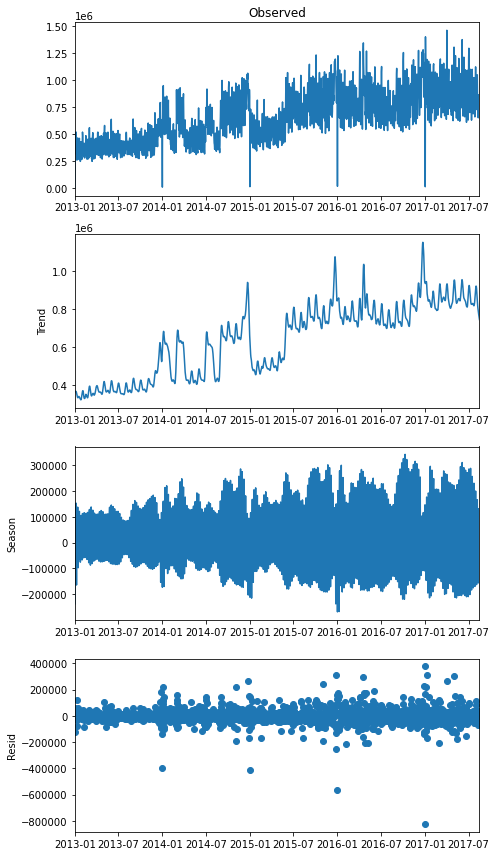

In [52]:
stl_model = STL(df_total_sales[["sales"]], period=7, seasonal=7).fit()
with mpl.rc_context():
    mpl.rc("figure", figsize=(7, 12))
    stl_model.plot()
    plt.tight_layout()
    plt.show()

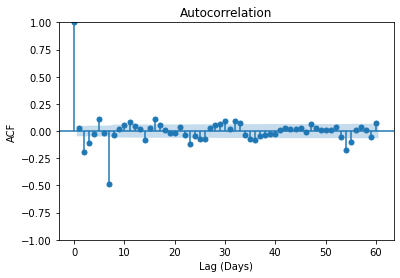

In [53]:
# Residual Check
fig = plot_acf(stl_model.resid.dropna(), lags=60)
plt.ylabel("ACF")
plt.xlabel("Lag (Days)")
plt.show()

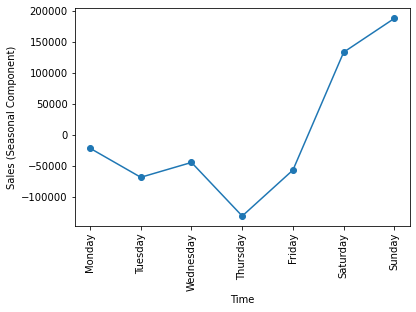

In [54]:
seasonal = stl_model.seasonal.groupby(stl_model.seasonal.index.day_of_week).mean()
seasonal.plot.line(xlabel="Time", ylabel="Sales (Seasonal Component)", marker="o")
plt.xticks(range(0, 7), calendar.day_name[0:], rotation="vertical")
plt.show()

### Resample Weekly

In [55]:
df_sales_weekly = df_total_sales.resample('7D').mean()
verify(df_sales_weekly)

(242, 1)


,sales
datetime,
2013-01-01,363956.181220
2013-01-08,332977.628174
2013-01-15,340838.619132
2013-01-22,320916.224872
2013-01-29,362248.459470


,sales
datetime,
2017-07-18,820367.709874
2017-07-25,855872.052943
2017-08-01,903114.532729
2017-08-08,764122.753677
2017-08-15,762661.935939


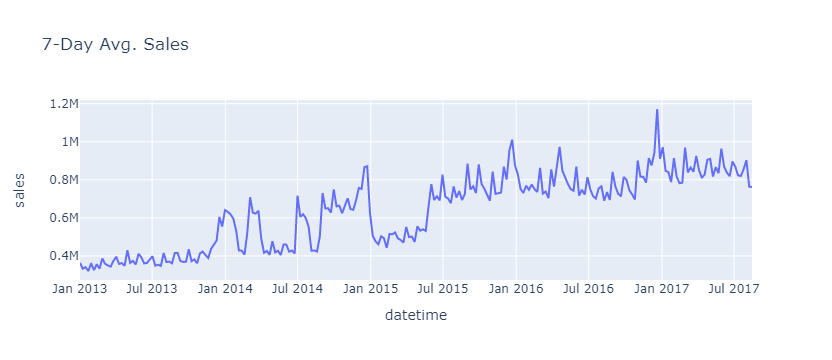

In [56]:
fig = px.line(df_sales_weekly, 
              x=df_sales_weekly.index, 
              y="sales",  
              title='7-Day Avg. Sales')
fig.show()

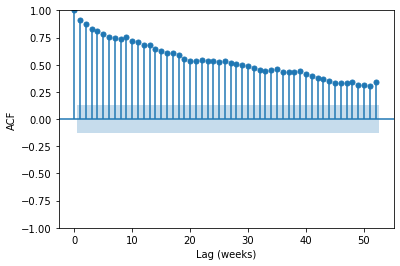

In [57]:
fig = plot_acf(df_sales_weekly["sales"], lags=52, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (weeks)")
plt.show()

Nenhum ciclo especial observado.

C:\Users\gduar\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



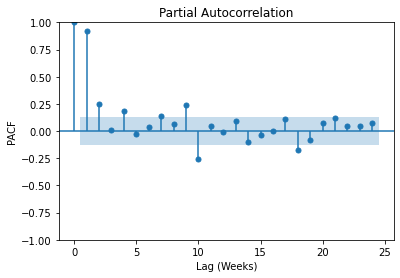

In [58]:
fig = plot_pacf(df_sales_weekly["sales"])
plt.ylabel("PACF")
plt.xlabel("Lag (Weeks)")
plt.show()

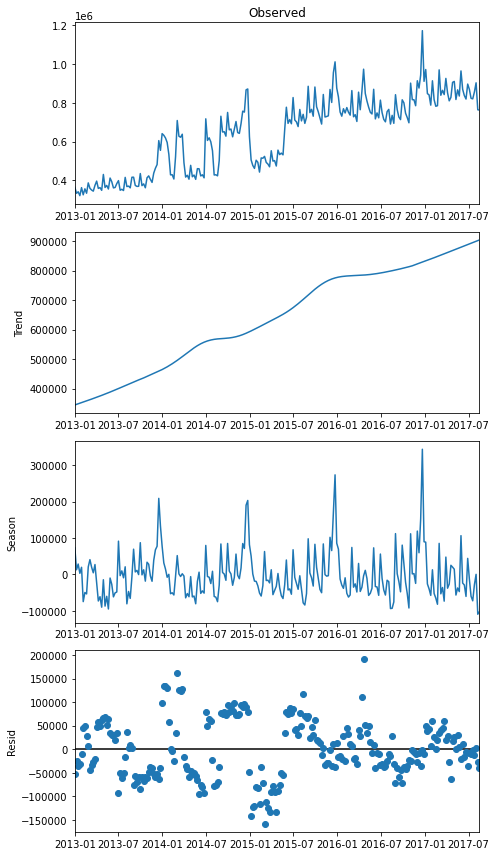

In [59]:
stl_model = STL(df_sales_weekly[["sales"]], period=52, seasonal=53).fit()
with mpl.rc_context():
    mpl.rc("figure", figsize=(7, 12))
    stl_model.plot()
    plt.tight_layout()
    plt.show()

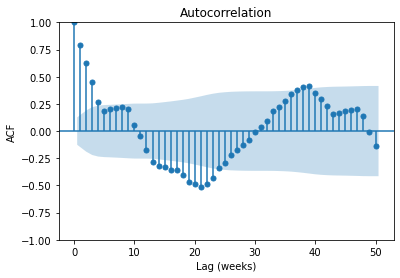

In [60]:
# Residual Check
fig = plot_acf(stl_model.resid.dropna(), lags=50)
plt.ylabel("ACF")
plt.xlabel("Lag (weeks)")
plt.show()

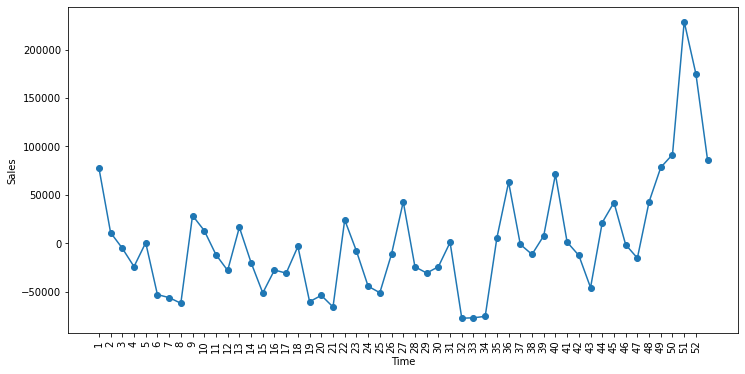

In [61]:
plt.figure(figsize=(12, 6))
seasonal = stl_model.seasonal.groupby(stl_model.seasonal.index.isocalendar().week).mean()
seasonal.plot.line(xlabel="Time", ylabel="Sales", marker="o")
plt.xticks(range(1, 53), rotation=90)
plt.show()

### Resample Monthly

In [62]:
df_sales_monthly = df_sales_weekly.resample('1M').mean()
verify(df_sales_monthly)

(56, 1)


,sales
datetime,
2013-01-31,344187.422574
2013-02-28,350366.012633
2013-03-31,356681.780570
2013-04-30,379031.459659
2013-05-31,375970.843464


,sales
datetime,
2017-04-30,848752.936181
2017-05-31,878736.338755
2017-06-30,855758.953590
2017-07-31,842229.464914
2017-08-31,809966.407448


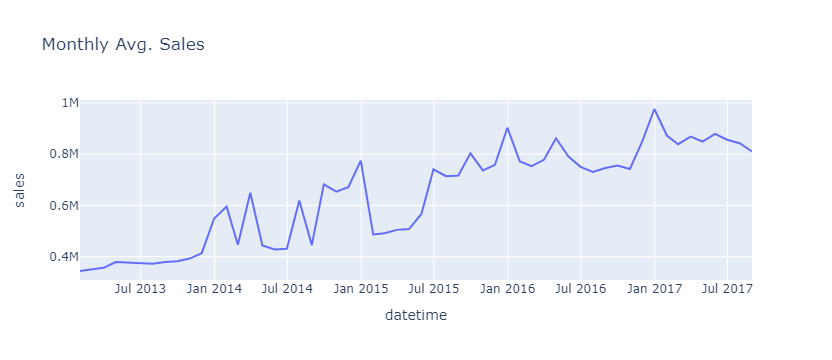

In [63]:
fig = px.line(df_sales_monthly, 
              x=df_sales_monthly.index, 
              y="sales",  
              title='Monthly Avg. Sales')
fig.show()

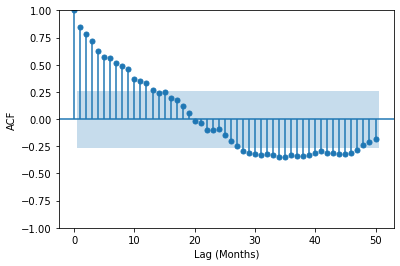

In [64]:
fig = plot_acf(df_sales_monthly["sales"], lags=50, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (Months)")
plt.show()

Nenhum ciclo especial observado.

C:\Users\gduar\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



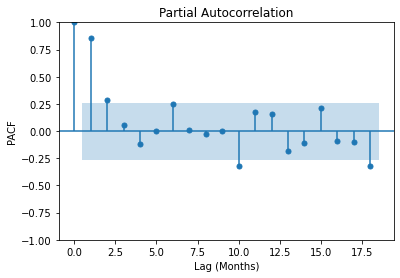

In [65]:
fig = plot_pacf(df_sales_monthly["sales"])
plt.ylabel("PACF")
plt.xlabel("Lag (Months)")
plt.show()

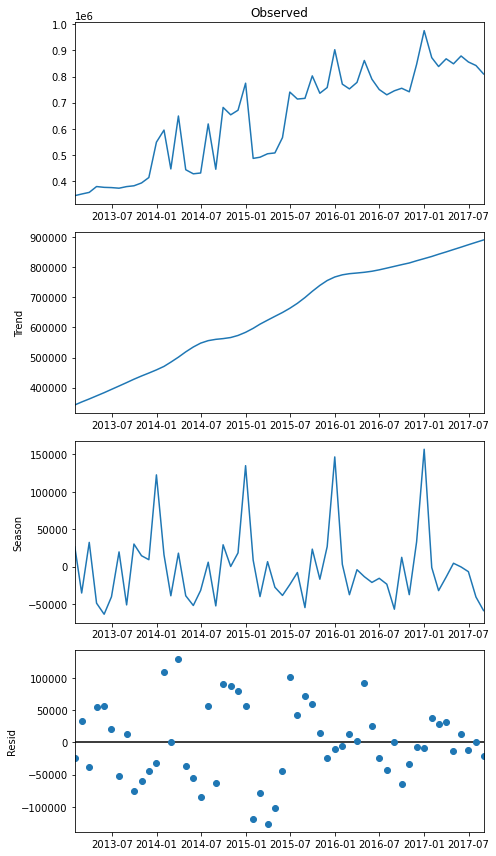

In [66]:
stl_model = STL(df_sales_monthly[["sales"]], period=12, seasonal=13).fit()
with mpl.rc_context():
    mpl.rc("figure", figsize=(7, 12))
    stl_model.plot()
    plt.tight_layout()
    plt.show()

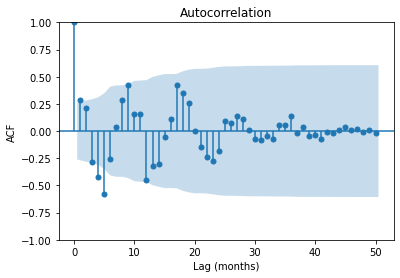

In [67]:
# Residual Check
fig = plot_acf(stl_model.resid.dropna(), lags=50)
plt.ylabel("ACF")
plt.xlabel("Lag (months)")
plt.show()

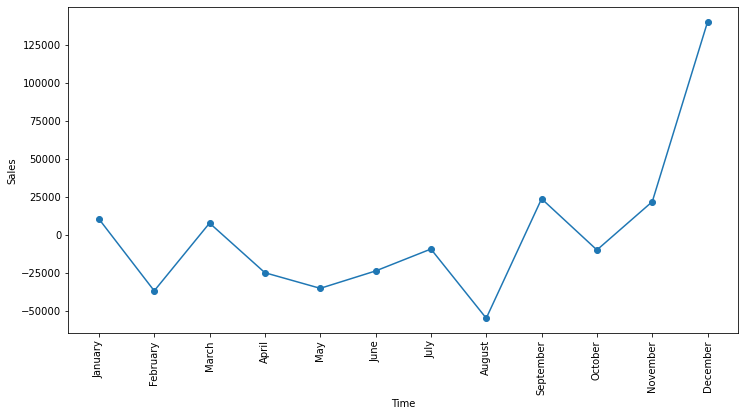

In [68]:
plt.figure(figsize=(12, 6))
seasonal = stl_model.seasonal.groupby(stl_model.seasonal.index.month).mean()
seasonal.plot.line(xlabel="Time", ylabel="Sales", marker="o")
plt.xticks(range(1, 13), calendar.month_name[1:], rotation=90)
plt.show()

## Transactions

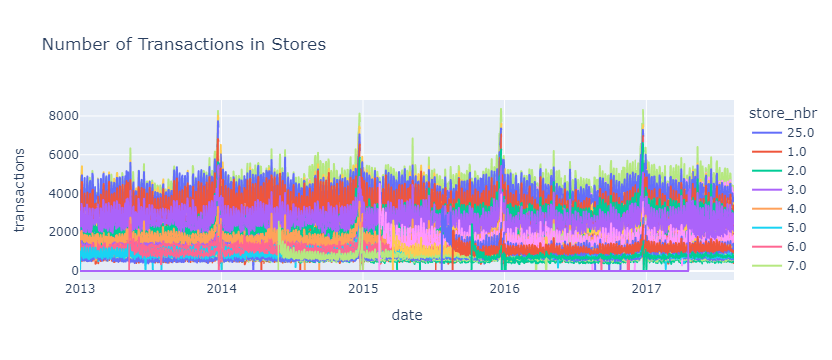

In [69]:
fig = px.line(
    df_transactions, 
    x="date", 
    y="transactions", 
    color="store_nbr", 
    title='Number of Transactions in Stores')
fig.show()

In [70]:
df_transactions_sum = df_transactions.groupby("date").sum()[["transactions"]].reset_index()
df_transactions_sum["datetime"] = pd.to_datetime(df_transactions_sum["date"])
df_transactions_sum.set_index("datetime", inplace=True)
verify(df_transactions_sum)

(1688, 2)


,date,transactions
datetime,,
2013-01-01,2013-01-01,770.0
2013-01-02,2013-01-02,93215.0
2013-01-03,2013-01-03,78504.0
2013-01-04,2013-01-04,78494.0
2013-01-05,2013-01-05,93573.0


,date,transactions
datetime,,
2017-08-11,2017-08-11,89551.0
2017-08-12,2017-08-12,89927.0
2017-08-13,2017-08-13,85993.0
2017-08-14,2017-08-14,85448.0
2017-08-15,2017-08-15,86561.0


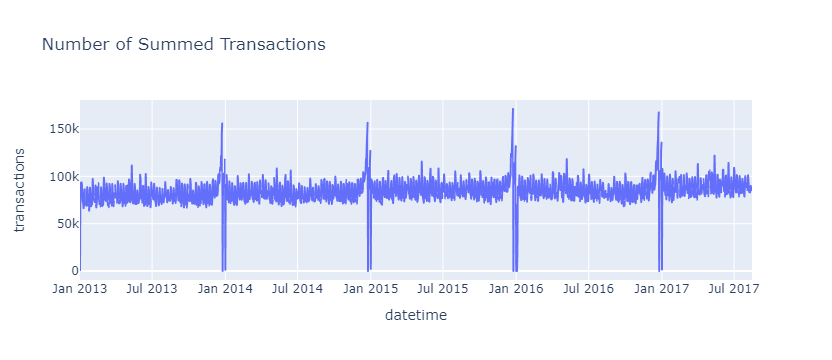

In [71]:
fig = px.line(df_transactions_sum, 
              x=df_transactions_sum.index, 
              y="transactions",  
              title='Number of Summed Transactions')
fig.show()

### ACF

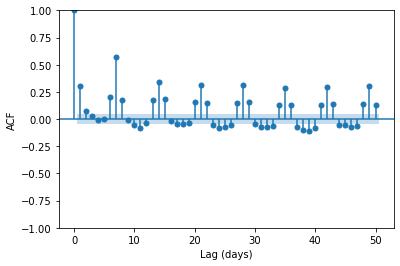

In [72]:
fig = plot_acf(df_transactions_sum["transactions"], lags=50, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (days)")
plt.show()

Ciclos em intervalos de 7 dias foram observados.

### Decomposition

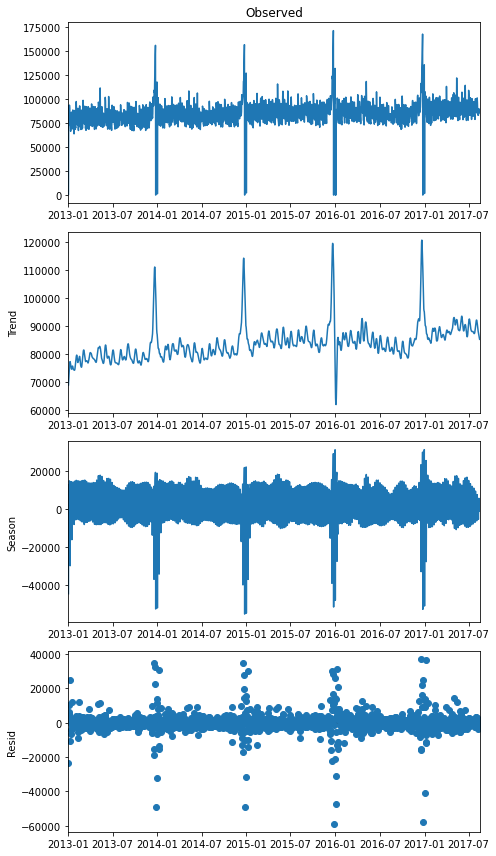

In [73]:
stl_model = STL(df_transactions_sum[["transactions"]], period=7, seasonal=7).fit()
with mpl.rc_context():
    mpl.rc("figure", figsize=(7, 12))
    stl_model.plot()
    plt.tight_layout()
    plt.show()

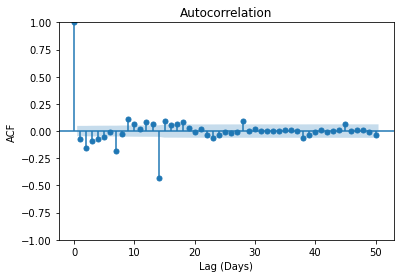

In [74]:
# Residual Check
fig = plot_acf(stl_model.resid.dropna(), lags=50)
plt.ylabel("ACF")
plt.xlabel("Lag (Days)")
plt.show()

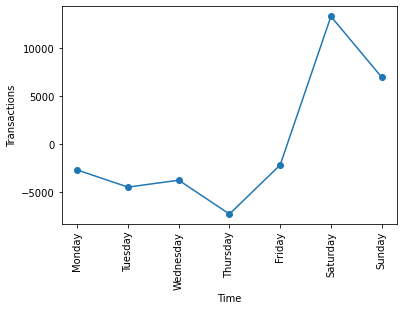

In [75]:
seasonal = stl_model.seasonal.groupby(stl_model.seasonal.index.day_of_week).mean()
seasonal.plot.line(xlabel="Time", ylabel="Transactions", marker="o")
plt.xticks(range(0, 7), calendar.day_name[0:], rotation="vertical")
plt.show()

### Resample Weekly

In [76]:
df_transactions_weekly = df_transactions_sum.resample('7D').mean()
verify(df_transactions_weekly)

(242, 1)


,transactions
datetime,
2013-01-01,72945.285714
2013-01-08,74701.714286
2013-01-15,75848.285714
2013-01-22,73642.857143
2013-01-29,78228.000000


,transactions
datetime,
2017-07-18,87602.285714
2017-07-25,87957.428571
2017-08-01,92324.857143
2017-08-08,86122.428571
2017-08-15,86561.000000


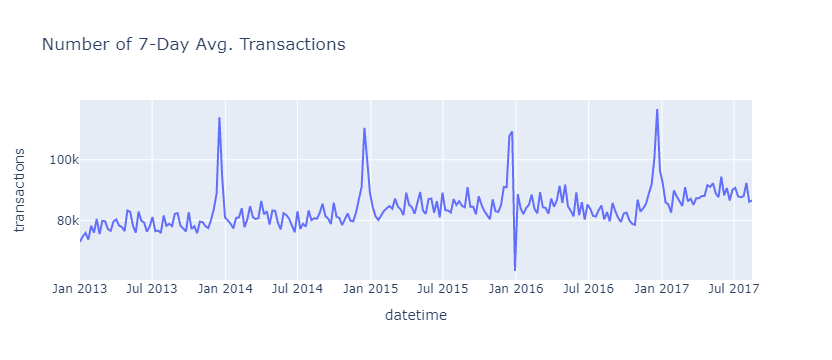

In [77]:
fig = px.line(df_transactions_weekly, 
              x=df_transactions_weekly.index, 
              y="transactions",  
              title='Number of 7-Day Avg. Transactions')
fig.show()

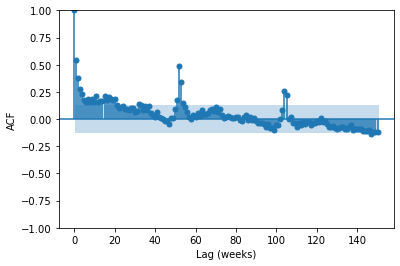

In [78]:
fig = plot_acf(df_transactions_weekly["transactions"], lags=150, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (weeks)")
plt.show()

Observou-se também uma periodicidade de 1 ano (52 semanas).

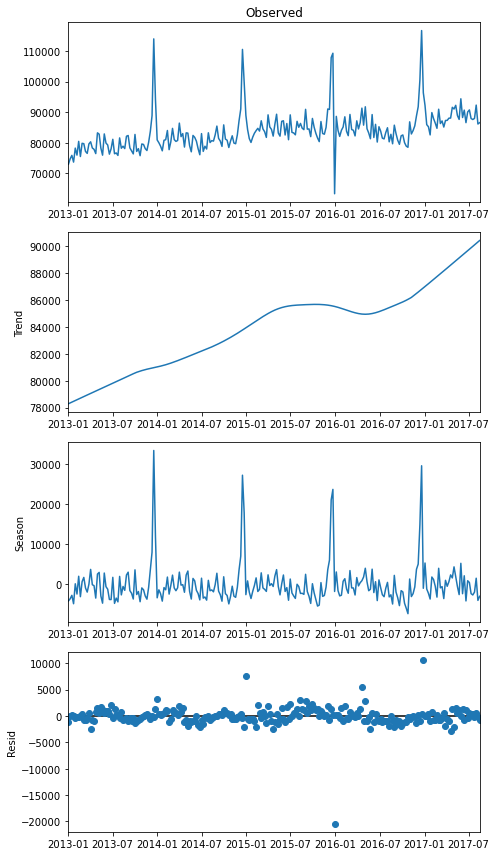

In [79]:
stl_model = STL(df_transactions_weekly[["transactions"]], period=52, seasonal=53).fit()
with mpl.rc_context():
    mpl.rc("figure", figsize=(7, 12))
    stl_model.plot()
    plt.tight_layout()
    plt.show()

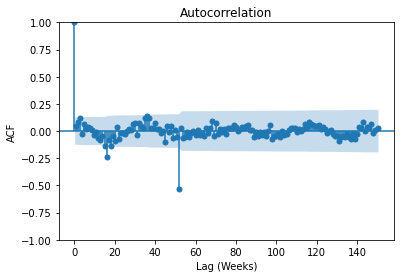

In [80]:
# Residual Check
fig = plot_acf(stl_model.resid.dropna(), lags=150)
plt.ylabel("ACF")
plt.xlabel("Lag (Weeks)")
plt.show()

C:\Users\gduar\AppData\Local\Temp\ipykernel_5736\380582277.py:2: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)



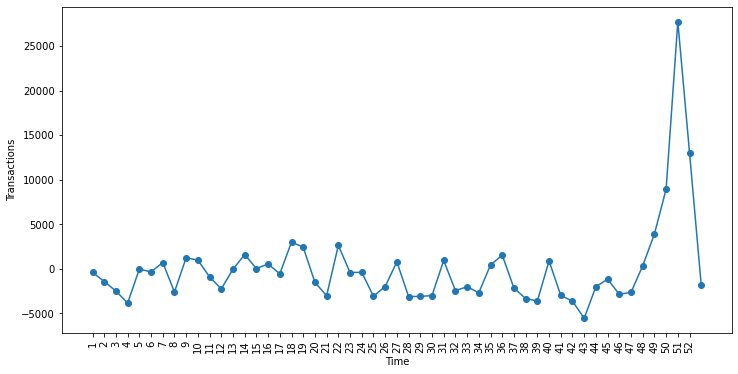

In [81]:
plt.figure(figsize=(12, 6))
seasonal = stl_model.seasonal.groupby(stl_model.seasonal.index.week).mean()
seasonal.plot.line(xlabel="Time", ylabel="Transactions", marker="o")
plt.xticks(range(1, 53), rotation=90)
plt.show()

### Resample Monthly

In [82]:
df_transactions_monthly = df_transactions_weekly.resample('1M').mean()
verify(df_transactions_monthly)

(56, 1)


,transactions
datetime,
2013-01-31,75073.228571
2013-02-28,77912.285714
2013-03-31,78229.535714
2013-04-30,79210.942857
2013-05-31,79954.107143


,transactions
datetime,
2017-04-30,88756.250000
2017-05-31,90847.571429
2017-06-30,88892.964286
2017-07-31,88559.464286
2017-08-31,88336.095238


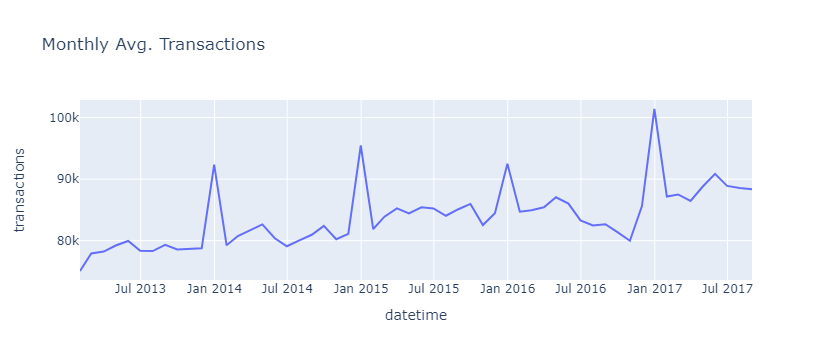

In [83]:
fig = px.line(df_transactions_monthly, 
              x=df_transactions_monthly.index, 
              y="transactions",  
              title='Monthly Avg. Transactions')
fig.show()

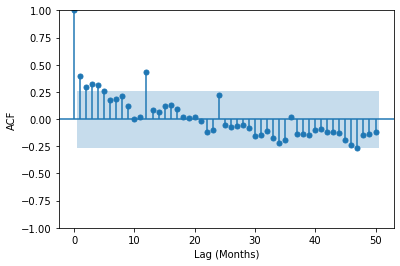

In [84]:
fig = plot_acf(df_transactions_monthly["transactions"], lags=50, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (Months)")
plt.show()

Ciclo de 1 ano observado como antes.

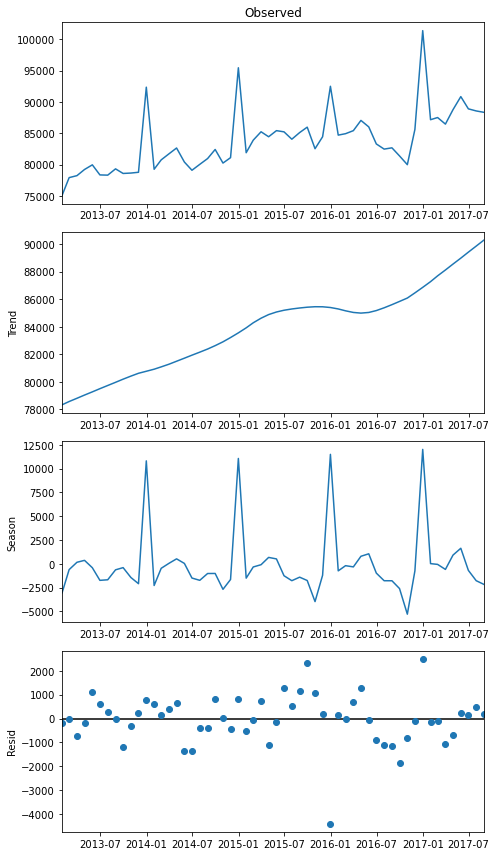

In [85]:
stl_model = STL(df_transactions_monthly[["transactions"]], period=12, seasonal=13).fit()
with mpl.rc_context():
    mpl.rc("figure", figsize=(7, 12))
    stl_model.plot()
    plt.tight_layout()

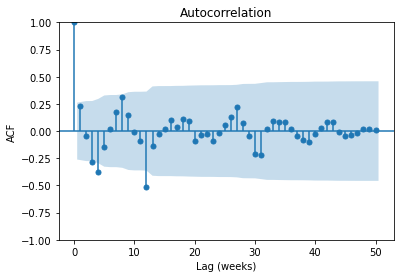

In [86]:
# Residual Check
fig = plot_acf(stl_model.resid.dropna(), lags=50)
plt.ylabel("ACF")
plt.xlabel("Lag (weeks)")
plt.show()

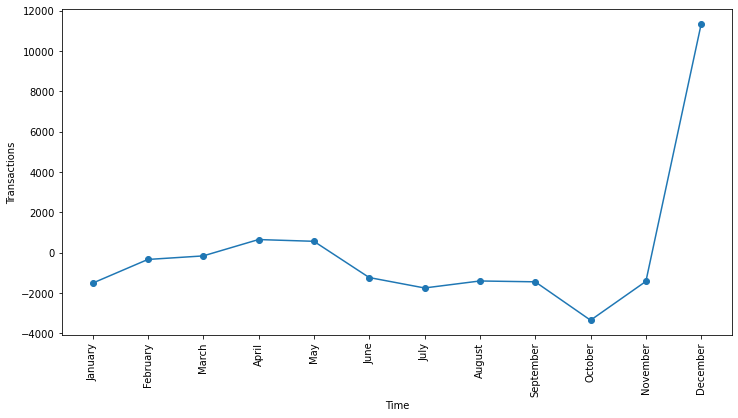

In [87]:
plt.figure(figsize=(12, 6))
seasonal = stl_model.seasonal.groupby(stl_model.seasonal.index.month).mean()
seasonal.plot.line(xlabel="Time", ylabel="Transactions", marker="o")
plt.xticks(range(1, 13), calendar.month_name[1:], rotation=90)
plt.show()

### Transactions vs Sales

In [88]:
df_transactions_sales = df_transactions.merge(df_total_sales,
                                            on='date',
                                            how='left')
verify(df_transactions_sales)

(91152, 4)


,date,store_nbr,transactions,sales
0,2013-01-01,25.0,770.0,2511.618999
1,2013-01-02,25.0,1038.0,496092.417944
2,2013-01-03,25.0,887.0,361461.231124
3,2013-01-04,25.0,1054.0,354459.677093
4,2013-01-05,25.0,1355.0,477350.121229


,date,store_nbr,transactions,sales
91147,2017-08-11,52.0,2957.0,826373.722022
91148,2017-08-12,52.0,2804.0,792630.535079
91149,2017-08-13,52.0,2433.0,865639.677471
91150,2017-08-14,52.0,2074.0,760922.406081
91151,2017-08-15,52.0,2255.0,762661.935939


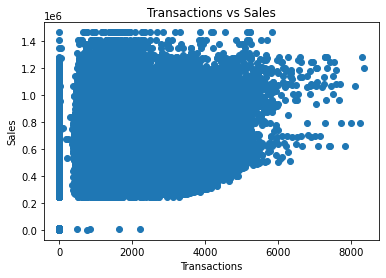

In [89]:
plt.figure()
plt.scatter(
    x=df_transactions_sales["transactions"],
    y=df_transactions_sales["sales"]
)
plt.title("Transactions vs Sales")
plt.xlabel("Transactions")
plt.ylabel("Sales")
plt.show()

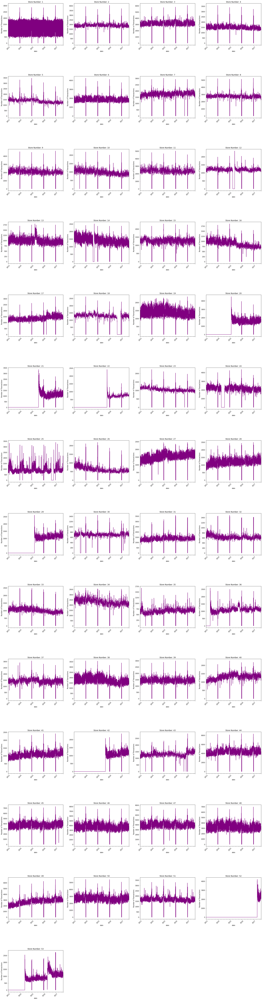

In [90]:
fig= plt.figure(figsize=(30,120))
fig.subplots_adjust(hspace=0.75)
for i,store in enumerate(range(1,54)):
    ax = fig.add_subplot(14,4,i+1)
    df_transactions_sales.set_index('date').query('store_nbr==@store').transactions.plot(c='purple');
    plt.title('Store Number: ' + str(store));
    plt.ylabel('Number of Transactions')
    plt.xticks(rotation=45);

## Oil

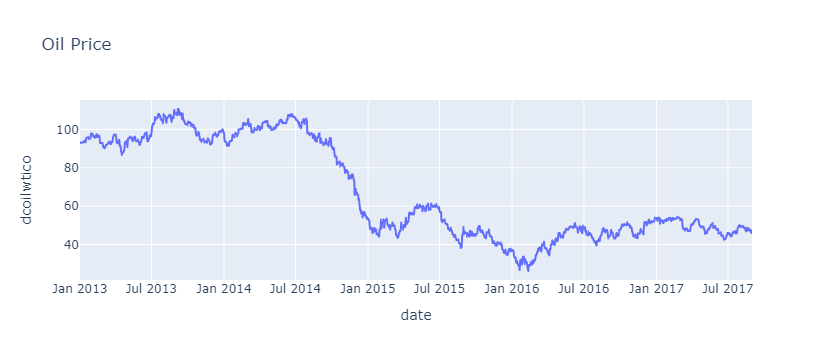

In [91]:
fig = px.line(
    df_oil, 
    x="date", 
    y="dcoilwtico",  
    title='Oil Price')
fig.show()

### ACF

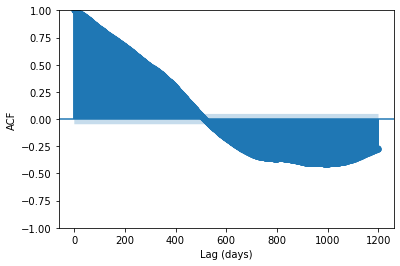

In [92]:
fig = plot_acf(df_oil["dcoilwtico"], lags=1200, title=None, bartlett_confint=False)
plt.ylabel("ACF")
plt.xlabel("Lag (days)")
plt.show()

### Oil vs Sales

In [93]:
df_oil_sales = df_oil.merge(df_total_sales, on='date', how='inner')
verify(df_oil_sales)

(1688, 3)


,date,dcoilwtico,sales
0,2013-01-01,93.14,2511.618999
1,2013-01-02,93.14,496092.417944
2,2013-01-03,92.97,361461.231124
3,2013-01-04,93.12,354459.677093
4,2013-01-05,93.12,477350.121229


,date,dcoilwtico,sales
1683,2017-08-11,48.81,826373.722022
1684,2017-08-12,48.81,792630.535079
1685,2017-08-13,48.81,865639.677471
1686,2017-08-14,47.59,760922.406081
1687,2017-08-15,47.57,762661.935939


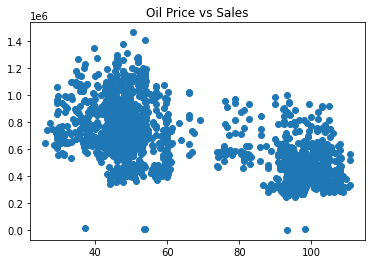

In [94]:
plt.figure()
plt.scatter(
    x=df_oil_sales["dcoilwtico"],
    y=df_oil_sales["sales"]
)
plt.title("Oil Price vs Sales")
plt.show()

In [107]:
df_oil_sales = df_oil.merge(df_sales, on='date', how='inner')
verify(df_oil_sales)

(3008016, 11)


,date,dcoilwtico,index,store_nbr,family,sales,onpromotion,year,month,day,day_of_week
0,2013-01-01,93.14,0,1,AUTOMOTIVE,0.0,0,2013,1,1,1
1,2013-01-01,93.14,1688,1,BABY CARE,0.0,0,2013,1,1,1
2,2013-01-01,93.14,3376,1,BEAUTY,0.0,0,2013,1,1,1
3,2013-01-01,93.14,5064,1,BEVERAGES,0.0,0,2013,1,1,1
4,2013-01-01,93.14,6752,1,BOOKS,0.0,0,2013,1,1,1


,date,dcoilwtico,index,store_nbr,family,sales,onpromotion,year,month,day,day_of_week
3008011,2017-08-15,47.57,3001263,9,POULTRY,438.133,0,2017,8,15,1
3008012,2017-08-15,47.57,3002951,9,PREPARED FOODS,154.553,1,2017,8,15,1
3008013,2017-08-15,47.57,3004639,9,PRODUCE,2419.729,148,2017,8,15,1
3008014,2017-08-15,47.57,3006327,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,2017,8,15,1
3008015,2017-08-15,47.57,3008015,9,SEAFOOD,16.000,0,2017,8,15,1


In [108]:
df_oil_sales.groupby('family')[['sales','dcoilwtico']].corr().iloc[0::2,-1].sort_values()

family                           
HOME CARE                   sales   -0.453214
MAGAZINES                   sales   -0.380649
HOME AND KITCHEN II         sales   -0.375303
PRODUCE                     sales   -0.340550
HOME AND KITCHEN I          sales   -0.328361
PLAYERS AND ELECTRONICS     sales   -0.326423
BEVERAGES                   sales   -0.318562
PET SUPPLIES                sales   -0.306859
CELEBRATION                 sales   -0.294923
LADIESWEAR                  sales   -0.254959
DAIRY                       sales   -0.220374
PERSONAL CARE               sales   -0.204237
BEAUTY                      sales   -0.203407
GROCERY I                   sales   -0.195831
DELI                        sales   -0.190123
BREAD/BAKERY                sales   -0.176988
LAWN AND GARDEN             sales   -0.165008
CLEANING                    sales   -0.159126
AUTOMOTIVE                  sales   -0.145859
BABY CARE                   sales   -0.122507
POULTRY                     sales   -0.114208


Algumas famílias de produtos (Home Care, Magazines, Home and Kitchen II, Produce, Home and Kitchen I)
têm correlação ligeiramente mais forte com o preço do petróleo

## Stores

In [99]:
df_stores_vs_sales = df_sales.merge(df_stores, on='store_nbr', how='left')
verify(df_stores_vs_sales)

(3008016, 14)


,index,date,store_nbr,family,sales,onpromotion,year,month,day,day_of_week,city,state,type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,Quito,Pichincha,D,13
1,1,2013-01-02,1,AUTOMOTIVE,2.0,0,2013,1,2,2,Quito,Pichincha,D,13
2,2,2013-01-03,1,AUTOMOTIVE,3.0,0,2013,1,3,3,Quito,Pichincha,D,13
3,3,2013-01-04,1,AUTOMOTIVE,3.0,0,2013,1,4,4,Quito,Pichincha,D,13
4,4,2013-01-05,1,AUTOMOTIVE,5.0,0,2013,1,5,5,Quito,Pichincha,D,13


,index,date,store_nbr,family,sales,onpromotion,year,month,day,day_of_week,city,state,type,cluster
3008011,3008011,2017-08-11,9,SEAFOOD,23.831000,0,2017,8,11,4,Quito,Pichincha,B,6
3008012,3008012,2017-08-12,9,SEAFOOD,16.859001,4,2017,8,12,5,Quito,Pichincha,B,6
3008013,3008013,2017-08-13,9,SEAFOOD,20.000000,0,2017,8,13,6,Quito,Pichincha,B,6
3008014,3008014,2017-08-14,9,SEAFOOD,17.000000,0,2017,8,14,0,Quito,Pichincha,B,6
3008015,3008015,2017-08-15,9,SEAFOOD,16.000000,0,2017,8,15,1,Quito,Pichincha,B,6


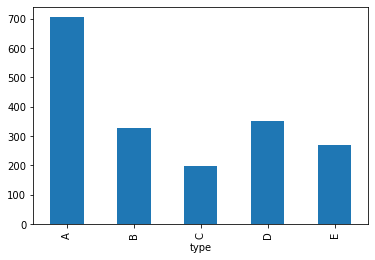

In [100]:
df_stores_vs_sales.groupby(['type']).sales.mean().plot(kind='bar');

Text(0.5, 1.0, 'Number of Stores by City')

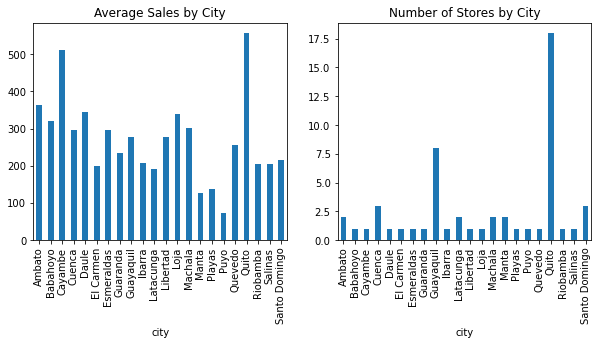

In [101]:
plt.figure(figsize=(10,4))

ax1 = plt.subplot(1,2,1)
df_stores_vs_sales.groupby(['city']).sales.mean().plot(kind='bar')
plt.title('Average Sales by City')
ax2 = plt.subplot(1,2,2)
df_stores_vs_sales.groupby(['city'])['store_nbr'].nunique().plot(kind='bar')
plt.title('Number of Stores by City')

Existe correlação positiva entre o número de lojas e a população da cidade. Guayaquil é a cidade mais populosa do Equador e Quito é a segunda.

<AxesSubplot:xlabel='cluster'>

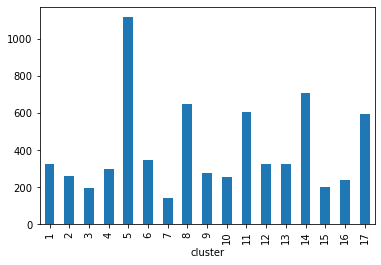

In [102]:
df_stores_vs_sales.groupby(['cluster']).sales.mean().plot(kind='bar')

De acordo com a descrição dos dados, o cluster é um agrupamento de lojas semelhantes. Não foi possível identificar a diferença entre essa variável e a variável type.

## Holidays

In [103]:
df_holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False
